In [2]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics.pairwise import cosine_distances
from itertools import product


## PCA

In [3]:
ruta = r"C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\aire_clima_2024_final.csv"
df = pd.read_csv(ruta, encoding='utf-8-sig')

# Seleccionar las variables para PCA
variables = ["PM10", "PM2.5", "Monóxido de carbono", "Dióxido de nitrógeno", 
             "Dióxido de azufre", "Ozono", "Polvo", "Temperatura", "Humedad relativa"]

df_pca = df[variables].dropna()

###  Estandarización

In [4]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_pca)

### Aplicar PCA

In [5]:
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

### Varianza

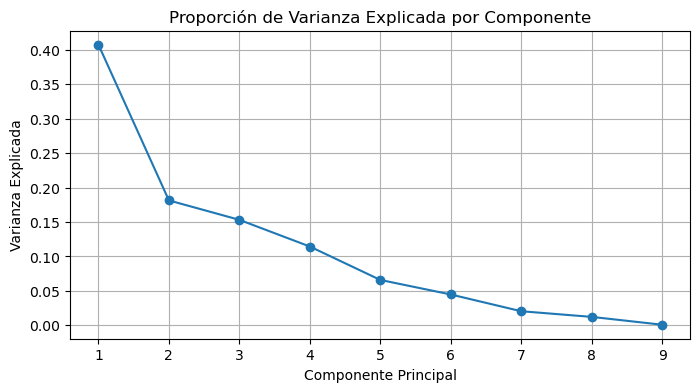

In [6]:
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1),
         pca.explained_variance_ratio_, marker='o')
plt.title("Proporción de Varianza Explicada por Componente")
plt.xlabel("Componente Principal")
plt.ylabel("Varianza Explicada")
plt.grid(True)
plt.show()


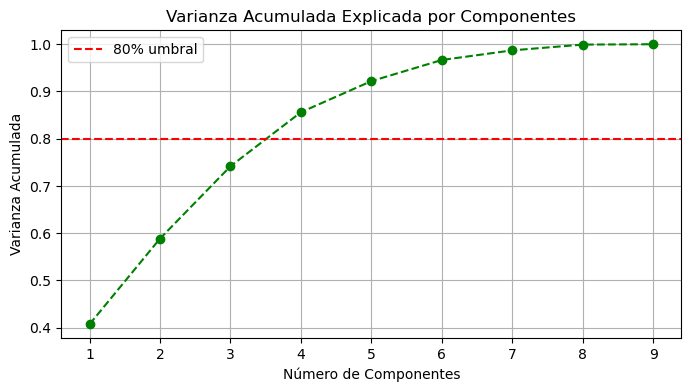

In [7]:
# Varianza explicada por cada componente
var_explicada = pca.explained_variance_ratio_

# Varianza acumulada
var_acumulada = np.cumsum(var_explicada)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(var_acumulada) + 1), var_acumulada, marker='o', linestyle='--', color='green')
plt.axhline(y=0.8, color='red', linestyle='dashed', label='80% umbral')
plt.xticks(range(1, len(var_acumulada) + 1))
plt.title("Varianza Acumulada Explicada por Componentes")
plt.xlabel("Número de Componentes")
plt.ylabel("Varianza Acumulada")
plt.grid(True)
plt.legend()
plt.show()


In [8]:
pca_df = pd.DataFrame(
    pca.components_,
    columns=variables,
    index=[f"PC{i+1}" for i in range(len(variables))]
)
pca_df

,PM10,PM2.5,Monóxido de carbono,Dióxido de nitrógeno,Dióxido de azufre,Ozono,Polvo,Temperatura,Humedad relativa
PC1,0.422806,0.446022,0.461608,0.446135,0.427544,0.138687,0.073449,-0.047590,0.022214
PC2,0.328103,0.324249,0.069493,-0.279913,-0.275846,-0.471881,0.066493,0.457490,0.437663
PC3,0.285948,0.054030,-0.144737,-0.161259,-0.163141,0.323408,0.613097,0.315484,-0.511601
PC4,0.120525,-0.142415,-0.068391,-0.001483,0.038238,-0.372971,0.630568,-0.618910,0.198183
PC5,0.094274,-0.013147,-0.300796,0.017181,-0.040313,0.654166,0.107933,-0.015282,0.677293
PC6,0.182203,0.367319,0.196570,-0.318200,-0.524275,0.220248,-0.250845,-0.535163,-0.138894
PC7,-0.324097,-0.297203,0.740119,0.077652,-0.337500,0.150237,0.267819,0.136421,0.161275
PC8,-0.030651,-0.062254,0.261710,-0.767405,0.564859,0.124017,0.018144,-0.024337,0.049152
PC9,-0.685001,0.667402,-0.105244,-0.010955,0.059804,0.000943,0.264670,0.004648,0.022415


In [9]:
df_pca_result = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])

## Gráfico de dispersión (biplot) de los dos primeros componentes

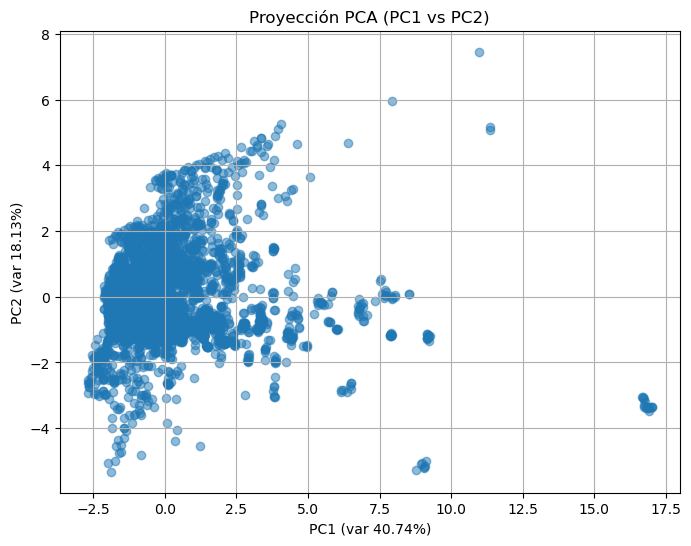

In [10]:
# Usamos los dos primeros componentes
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5)
plt.xlabel("PC1 (var %.2f%%)" % (pca.explained_variance_ratio_[0]*100))
plt.ylabel("PC2 (var %.2f%%)" % (pca.explained_variance_ratio_[1]*100))
plt.title("Proyección PCA (PC1 vs PC2)")
plt.grid(True)
plt.show()


In [11]:
# Crear DataFrame con los 3 primeros componentes
df_3d = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'PC3': X_pca[:, 2]
})

# Agregá otras columnas si querés colorear por país, ciudad, etc.
# df_3d['ciudad'] = df['ciudad_id']  # ejemplo

# Gráfico 3D
fig = px.scatter_3d(
    df_3d, x='PC1', y='PC2', z='PC3',
    opacity=0.6,
    title="Proyección PCA en 3D (PC1, PC2, PC3)"
)

fig.update_layout(scene=dict(
    xaxis_title=f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)",
    yaxis_title=f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)",
    zaxis_title=f"PC3 ({pca.explained_variance_ratio_[2]*100:.2f}%)"
))

fig.show()


# K-Means

## Estandarización

In [12]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_pca)  # df_pca: DataFrame con tus 9 variables

## Elegir número de clusters (Elbow Method)

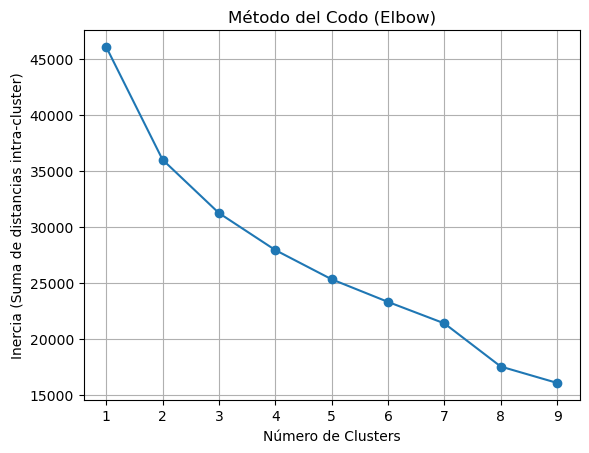

In [13]:
inertia = []
K = range(1, 10)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(K, inertia, marker='o')
plt.title("Método del Codo (Elbow)")
plt.xlabel("Número de Clusters")
plt.ylabel("Inercia (Suma de distancias intra-cluster)")
plt.grid(True)
plt.show()


##  K-Means (k=6)

In [14]:
# Aplicar K-Means con 3 clusters
kmeans = KMeans(n_clusters=6, random_state=42)
labels = kmeans.fit_predict(X_scaled)

# Agregar etiquetas al DataFrame original
df_clustered = df.copy()
df_clustered["cluster"] = labels

In [15]:
# Crear DataFrame para visualización
df_visual = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": labels.astype(str)  # Convertir a string
})

# Mapa de colores consistente
color_map = {
    '0': '#E377C2',  # rosado
    '1': '#FF7F0E',  # naranja
    '2': '#1F77B4',  # azul
    '3': '#2CA02C',  # verde
    '4': '#D62728',  # rojo
    '5': '#9467BD',  # morado
    '6': '#8C564B',  # marrón
    '7': '#17BECF',  # cian
    '8': '#BCBD22'   # amarillo oliva
}

# Gráfico PCA con colores fijos
fig = px.scatter(
    df_visual, x="PC1", y="PC2", color="cluster",
    title="Visualización de Clusters (k=6) en Espacio PCA",
    labels={"cluster": "Cluster"},
    opacity=0.7,
    color_discrete_map=color_map
)

fig.update_traces(marker=dict(size=6))
fig.update_layout(title_x=0.5)
fig.show()


In [16]:
# Asegurar que los índices están en el mismo orden
print((df.index == df_clustered.index).all())  # Esto debe devolver True
df["cluster"] = df_clustered["cluster"]

True


In [17]:

# Convertir cluster a string para compatibilidad con color_discrete_map
df["cluster"] = df["cluster"].astype(str)

# Mismo mapa de colores usado en los boxplots
color_map = {
    '0': '#E377C2',  # rosado
    '1': '#FF7F0E',  # naranja
    '2': '#1F77B4',  # azul
    '3': '#2CA02C',  # verde
    '4': '#D62728',  # rojo
    '5': '#9467BD',  # morado
    '6': '#8C564B',  # marrón
    '7': '#17BECF',  # cian
    '8': '#BCBD22'   # amarillo oliva
}

# Mapa geográfico con colores fijos por cluster
fig = px.scatter_geo(
    df,
    lat='lat',
    lon='lng',
    hover_name='ciudad_id',  # o 'city_ascii'
    color="cluster",
    projection='natural earth',
    title="Mapa de Clusters (K-Means) por Ubicación - América del Sur",
    color_discrete_map=color_map
)

# Limitar a Sudamérica
fig.update_geos(
    lataxis_range=[-60, 15],
    lonaxis_range=[-90, -30],
    visible=True
)

fig.update_layout(height=700)
fig.show()


In [18]:
# Asegurarse de que 'cluster' sea string
df["cluster"] = df["cluster"].astype(str)

# Contar elementos por cluster
df_counts = df["cluster"].value_counts().reset_index()
df_counts.columns = ["cluster", "cantidad"]
df_counts = df_counts.sort_values("cluster", key=lambda x: x.astype(int))  # orden numérico

# Mapa de colores consistente
color_map = {
    '0': '#E377C2',
    '1': '#FF7F0E',
    '2': '#1F77B4',
    '3': '#2CA02C',
    '4': '#D62728',
    '5': '#9467BD',
    '6': '#8C564B',
    '7': '#17BECF',
    '8': '#BCBD22'
}

# Gráfico de barras con etiquetas
fig = px.bar(
    df_counts,
    x="cluster",
    y="cantidad",
    color="cluster",
    color_discrete_map=color_map,
    text="cantidad",  # Etiquetas
    title="Cantidad de Elementos por Cluster",
    labels={"cluster": "Cluster", "cantidad": "Cantidad de elementos"}
)

# Posicionar texto por fuera de las barras
fig.update_traces(textposition="outside")
fig.update_layout(title_x=0.5, uniformtext_minsize=8, uniformtext_mode='hide')

fig.show()

In [19]:
# Lista de variables
variables = ["PM10", "PM2.5", "Monóxido de carbono", "Dióxido de nitrógeno",
             "Dióxido de azufre", "Ozono", "Polvo", "Temperatura", "Humedad relativa"]

# Asegurarse de que cluster sea string ordenable
df["cluster"] = df["cluster"].astype(str)
cluster_order = sorted(df["cluster"].unique(), key=int)

# Paleta de colores fija para los clusters
color_map = {
    '0': '#E377C2',  # rosa
    '1': '#FF7F0E',  # naranja
    '2': '#1F77B4',  # azul
    '3': '#2CA02C',  # verde
    '4': '#D62728',  # rojo
    '5': '#9467BD',  # morado
    '6': '#8C564B',  # marrón
    '7': '#17BECF',  # cian
    '8': '#BCBD22'   # amarillo oliva
}

# Crear subplots: 3 filas, 3 columnas
fig = make_subplots(rows=3, cols=3,
                    subplot_titles=[f"{var}" for var in variables],
                    horizontal_spacing=0.08,
                    vertical_spacing=0.12)

# Agregar cada boxplot
for i, var in enumerate(variables):
    row = i // 3 + 1
    col = i % 3 + 1

    for cluster in cluster_order:
        cluster_data = df[df["cluster"] == cluster][var]
        fig.add_trace(
            go.Box(
                y=cluster_data,
                name=f"Cluster {cluster}",
                marker_color=color_map.get(cluster, "#CCCCCC"),  # color por cluster
                boxpoints="outliers",
                marker=dict(opacity=0.6),
                showlegend=(i == 0)
            ),
            row=row,
            col=col
        )

    # Etiqueta del eje Y
    fig.update_yaxes(title_text=var, row=row, col=col)

# Diseño general
fig.update_layout(
    height=1000,
    width=1200,
    title_text="Boxplots por Variable y Cluster",
    title_x=0.5,
    showlegend=True
)

fig.show()

##  K-Means (k=7)

In [20]:
# Aplicar K-Means con 3 clusters
kmeans = KMeans(n_clusters=7, random_state=42)
labels = kmeans.fit_predict(X_scaled)

# Agregar etiquetas al DataFrame original
df_clustered = df.copy()
df_clustered["cluster"] = labels

In [21]:
# Crear DataFrame para visualización
df_visual = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "cluster": labels.astype(str)  # Convertir a string
})

# Mapa de colores consistente
color_map = {
    '0': '#E377C2',  # rosado
    '1': '#FF7F0E',  # naranja
    '2': '#1F77B4',  # azul
    '3': '#2CA02C',  # verde
    '4': '#D62728',  # rojo
    '5': '#9467BD',  # morado
    '6': '#8C564B',  # marrón
    '7': '#17BECF',  # cian
    '8': '#BCBD22'   # amarillo oliva
}

# Gráfico PCA con colores fijos
fig = px.scatter(
    df_visual, x="PC1", y="PC2", color="cluster",
    title="Visualización de Clusters (k=7) en Espacio PCA",
    labels={"cluster": "Cluster"},
    opacity=0.7,
    color_discrete_map=color_map
)

fig.update_traces(marker=dict(size=7))
fig.update_layout(title_x=0.5)
fig.show()

In [22]:
# Asegurar que los índices están en el mismo orden
print((df.index == df_clustered.index).all())  # Esto debe devolver True
df["cluster"] = df_clustered["cluster"]

True


In [23]:
# Asegurarse de que 'cluster' sea string
df["cluster"] = df["cluster"].astype(str)

# Contar elementos por cluster
df_counts = df["cluster"].value_counts().reset_index()
df_counts.columns = ["cluster", "cantidad"]
df_counts = df_counts.sort_values("cluster", key=lambda x: x.astype(int))  # orden numérico

# Mapa de colores consistente
color_map = {
    '0': '#E377C2',
    '1': '#FF7F0E',
    '2': '#1F77B4',
    '3': '#2CA02C',
    '4': '#D62728',
    '5': '#9467BD',
    '6': '#8C564B',
    '7': '#17BECF',
    '8': '#BCBD22'
}

# Gráfico de barras con etiquetas
fig = px.bar(
    df_counts,
    x="cluster",
    y="cantidad",
    color="cluster",
    color_discrete_map=color_map,
    text="cantidad",  # Etiquetas
    title="Cantidad de Elementos por Cluster",
    labels={"cluster": "Cluster", "cantidad": "Cantidad de elementos"}
)

# Posicionar texto por fuera de las barras
fig.update_traces(textposition="outside")
fig.update_layout(title_x=0.5, uniformtext_minsize=8, uniformtext_mode='hide')

fig.show()


In [24]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Lista de variables
variables = ["PM10", "PM2.5", "Monóxido de carbono", "Dióxido de nitrógeno",
             "Dióxido de azufre", "Ozono", "Polvo", "Temperatura", "Humedad relativa"]

# Asegurarse de que cluster sea string ordenable
df["cluster"] = df["cluster"].astype(str)
cluster_order = sorted(df["cluster"].unique(), key=int)

# Paleta de colores fija para los clusters
color_map = {
    '0': '#E377C2',  # rosa
    '1': '#FF7F0E',  # naranja
    '2': '#1F77B4',  # azul
    '3': '#2CA02C',  # verde
    '4': '#D62728',  # rojo
    '5': '#9467BD',  # morado
    '6': '#8C564B',  # marrón
    '7': '#17BECF',  # cian
    '8': '#BCBD22'   # amarillo oliva
}

# Crear subplots: 3 filas, 3 columnas
fig = make_subplots(rows=3, cols=3,
                    subplot_titles=[f"{var}" for var in variables],
                    horizontal_spacing=0.08,
                    vertical_spacing=0.12)

# Agregar cada boxplot
for i, var in enumerate(variables):
    row = i // 3 + 1
    col = i % 3 + 1

    for cluster in cluster_order:
        cluster_data = df[df["cluster"] == cluster][var]
        fig.add_trace(
            go.Box(
                y=cluster_data,
                name=f"Cluster {cluster}",
                marker_color=color_map.get(cluster, "#CCCCCC"),  # color por cluster
                boxpoints="outliers",
                marker=dict(opacity=0.6),
                showlegend=(i == 0)
            ),
            row=row,
            col=col
        )

    # Etiqueta del eje Y
    fig.update_yaxes(title_text=var, row=row, col=col)

# Diseño general
fig.update_layout(
    height=1000,
    width=1200,
    title_text="Boxplots por Variable y Cluster",
    title_x=0.5,
    showlegend=True
)

fig.show()


# DBSCAN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_distances
from sklearn.cluster import DBSCAN
from itertools import product
import plotly.express as px

# -------------------------
# 1. Cargar datos
# -------------------------
ruta = r"C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\aire_clima_2024_final.csv"
df_base = pd.read_csv(ruta, encoding='utf-8-sig')

variables = ["PM10", "PM2.5", "Monóxido de carbono", "Dióxido de nitrógeno",
             "Dióxido de azufre", "Ozono", "Polvo", "Temperatura", "Humedad relativa"]

X = df_base[variables].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# -------------------------
# 2. Parámetros para prueba
# -------------------------
metricas = ['euclidean', 'manhattan', 'chebyshev', 'cosine', 'minkowski']
eps_values = np.array([0.1, 0.25, 0.5, 0.75, 1, 1.1, 1.25, 1.5, 1.75, 2, 2.1, 2.25])
min_samples_values = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 20]

resultados = []

# -------------------------
# 3. Loop sobre combinaciones
# -------------------------
for metric in metricas:
    print(f"\n🔍 Calculando con distancia: {metric}")
    for eps, min_samples in product(eps_values, min_samples_values):
        try:
            if metric == 'cosine':
                X_norm = normalize(X_scaled)
                dist_matrix = cosine_distances(X_norm)
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
                labels = dbscan.fit_predict(dist_matrix)
            elif metric == 'minkowski':
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='minkowski', p=2)
                labels = dbscan.fit_predict(X_scaled)
            else:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
                labels = dbscan.fit_predict(X_scaled)

            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

            if n_clusters > 1:
                silhouette = silhouette_score(X_scaled, labels, metric='cosine' if metric == 'cosine' else metric)
            else:
                silhouette = -1

            resultados.append({
                'metric': metric,
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'silhouette': silhouette,
                'labels': labels
            })
        except Exception as e:
            print(f"❌ Error con métrica={metric}, eps={eps}, min_samples={min_samples}: {e}")

# -------------------------
# 4. Filtrar top 3 por métrica
# -------------------------
df_resultados = pd.DataFrame(resultados)
top_resultados = pd.concat([
    df_resultados[df_resultados['metric'] == m].sort_values(by='silhouette', ascending=False).head(3)
    for m in metricas
])

# -------------------------
# 5. Paleta de colores
# -------------------------
color_map = {
    '-1': '#999999', '0': '#E377C2', '1': '#FF7F0E', '2': '#1F77B4', '3': '#2CA02C',
    '4': '#D62728', '5': '#9467BD', '6': '#8C564B', '7': '#17BECF', '8': '#BCBD22',
    '9': '#FFD700', '10': '#A52A2A', '11': '#00CED1', '12': '#FF1493', '13': '#7FFF00',
    '14': '#00FF7F', '15': '#1E90FF', '16': '#DC143C', '17': '#8A2BE2', '18': '#20B2AA',
    '19': '#FA8072'
}

# -------------------------
# 6. Mostrar gráficos top por métrica
# -------------------------
for i, row in top_resultados.iterrows():
    metric = row['metric']
    eps = row['eps']
    min_samples = row['min_samples']
    silhouette = row['silhouette']
    labels = row['labels']

    print(f"📍 Mostrando gráfico: métrica={metric}, eps={eps}, min_samples={min_samples}")

    df_plot = df_base.copy()
    df_plot = df_plot.iloc[:len(labels)]
    df_plot['dbscan_cluster'] = labels.astype(str)

    n_clusters = len(set(labels)) - (1 if '-1' in df_plot["dbscan_cluster"].unique() else 0)
    titulo = f"DBSCAN | Métrica: {metric}, eps: {eps}, min_samples: {min_samples}, Clusters: {n_clusters}"
    if silhouette != -1:
        titulo += f", Silhouette: {silhouette:.3f}"

    fig = px.scatter_geo(
        df_plot,
        lat='lat',
        lon='lng',
        hover_name='city_ascii',
        color="dbscan_cluster",
        color_discrete_map=color_map,
        projection='natural earth',
        title=titulo
    )
    fig.update_geos(
        lataxis_range=[-60, 15],
        lonaxis_range=[-90, -30],
        visible=True
    )
    fig.update_layout(height=700, title_x=0.5)
    fig.show()



🔍 Calculando con distancia: euclidean

🔍 Calculando con distancia: manhattan

🔍 Calculando con distancia: chebyshev

🔍 Calculando con distancia: cosine

🔍 Calculando con distancia: minkowski
📍 Mostrando gráfico: métrica=euclidean, eps=2.1, min_samples=15


📍 Mostrando gráfico: métrica=euclidean, eps=2.0, min_samples=15


📍 Mostrando gráfico: métrica=euclidean, eps=2.1, min_samples=20


📍 Mostrando gráfico: métrica=manhattan, eps=0.25, min_samples=1


📍 Mostrando gráfico: métrica=manhattan, eps=0.5, min_samples=1


📍 Mostrando gráfico: métrica=manhattan, eps=2.25, min_samples=20


📍 Mostrando gráfico: métrica=chebyshev, eps=2.25, min_samples=15


📍 Mostrando gráfico: métrica=chebyshev, eps=2.25, min_samples=12


📍 Mostrando gráfico: métrica=chebyshev, eps=2.25, min_samples=10


📍 Mostrando gráfico: métrica=cosine, eps=0.1, min_samples=9


📍 Mostrando gráfico: métrica=cosine, eps=0.1, min_samples=8


📍 Mostrando gráfico: métrica=cosine, eps=0.1, min_samples=10


📍 Mostrando gráfico: métrica=minkowski, eps=2.1, min_samples=15


📍 Mostrando gráfico: métrica=minkowski, eps=2.0, min_samples=15


📍 Mostrando gráfico: métrica=minkowski, eps=2.1, min_samples=20


In [ ]:
# -------------------------
# 7. Guardar top resultados en CSV
# -------------------------
output_csv = r"C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\top_resultados_dbscan.csv"
top_resultados.drop(columns=['labels']).to_csv(output_csv, index=False)
print(f"✅ Resultados guardados en: {output_csv}")


# HDBSCAN

In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_distances
import plotly.express as px
from itertools import product
import hdbscan

# -------------------------
# 1. Cargar datos
# -------------------------
ruta = r"C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\aire_clima_2024_final.csv"
df_base = pd.read_csv(ruta, encoding='utf-8-sig')

variables = ["PM10", "PM2.5", "Monóxido de carbono", "Dióxido de nitrógeno",
             "Dióxido de azufre", "Ozono", "Polvo", "Temperatura", "Humedad relativa"]

X = df_base[variables].dropna()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# -------------------------
# 2. Parámetros para HDBSCAN
# -------------------------
metricas = ['euclidean', 'manhattan', 'chebyshev', 'cosine']
min_cluster_sizes = [5, 10, 15, 20]
min_samples_values = [5, 10, 15]

resultados = []

# -------------------------
# 3. Loop sobre combinaciones
# -------------------------
for metric in metricas:
    print(f"\n🔍 Calculando con distancia: {metric}")
    for min_cluster_size, min_samples in product(min_cluster_sizes, min_samples_values):
        try:
            if metric == 'cosine':
                X_norm = normalize(X_scaled)
                dist_matrix = cosine_distances(X_norm)
                clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size,
                                            min_samples=min_samples,
                                            metric='precomputed')
                labels = clusterer.fit_predict(dist_matrix)
                silhouette = silhouette_score(X_scaled, labels, metric='cosine') \
                    if len(set(labels)) - (1 if -1 in labels else 0) > 1 else -1
            else:
                clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size,
                                            min_samples=min_samples,
                                            metric=metric)
                labels = clusterer.fit_predict(X_scaled)
                silhouette = silhouette_score(X_scaled, labels, metric=metric) \
                    if len(set(labels)) - (1 if -1 in labels else 0) > 1 else -1

            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

            resultados.append({
                'metric': metric,
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'silhouette': silhouette,
                'labels': labels
            })
        except Exception as e:
            print(f"❌ Error con métrica={metric}, min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")

# -------------------------
# 4. Filtrar top 3 por métrica
# -------------------------
df_resultados = pd.DataFrame(resultados)
top_resultados = pd.concat([
    df_resultados[df_resultados['metric'] == m].sort_values(by='silhouette', ascending=False).head(3)
    for m in metricas
])

# -------------------------
# 5. Paleta de colores
# -------------------------
color_map = {
    '-1': '#999999', '0': '#E377C2', '1': '#FF7F0E', '2': '#1F77B4', '3': '#2CA02C',
    '4': '#D62728', '5': '#9467BD', '6': '#8C564B', '7': '#17BECF', '8': '#BCBD22',
    '9': '#FFD700', '10': '#A52A2A', '11': '#00CED1', '12': '#FF1493', '13': '#7FFF00',
    '14': '#00FF7F', '15': '#1E90FF', '16': '#DC143C', '17': '#8A2BE2', '18': '#20B2AA',
    '19': '#FA8072'
}

# -------------------------
# 6. Mostrar gráficos top por métrica
# -------------------------
for i, row in top_resultados.iterrows():
    metric = row['metric']
    min_cluster_size = row['min_cluster_size']
    min_samples = row['min_samples']
    silhouette = row['silhouette']
    labels = row['labels']

    print(f"📍 Mostrando gráfico: métrica={metric}, min_cluster_size={min_cluster_size}, min_samples={min_samples}")

    df_plot = df_base.copy()
    df_plot = df_plot.iloc[:len(labels)]
    df_plot['hdbscan_cluster'] = labels.astype(str)

    n_clusters = len(set(labels)) - (1 if '-1' in df_plot["hdbscan_cluster"].unique() else 0)
    titulo = f"HDBSCAN | Métrica: {metric}, min_cluster_size: {min_cluster_size}, min_samples: {min_samples}, Clusters: {n_clusters}"
    if silhouette != -1:
        titulo += f", Silhouette: {silhouette:.3f}"

    fig = px.scatter_geo(
        df_plot,
        lat='lat',
        lon='lng',
        hover_name='city_ascii',
        color="hdbscan_cluster",
        color_discrete_map=color_map,
        projection='natural earth',
        title=titulo
    )
    fig.update_geos(
        lataxis_range=[-60, 15],
        lonaxis_range=[-90, -30],
        visible=True
    )
    fig.update_layout(height=700, title_x=0.5)
    fig.show()

# -------------------------
# 7. Guardar top resultados en CSV
# -------------------------
output_csv = r"C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\top_resultados_hdbscan.csv"
top_resultados.drop(columns=['labels']).to_csv(output_csv, index=False)
print(f"✅ Resultados guardados en: {output_csv}")



🔍 Calculando con distancia: euclidean

🔍 Calculando con distancia: manhattan

🔍 Calculando con distancia: chebyshev

🔍 Calculando con distancia: cosine
📍 Mostrando gráfico: métrica=euclidean, min_cluster_size=20, min_samples=10


📍 Mostrando gráfico: métrica=euclidean, min_cluster_size=20, min_samples=15


📍 Mostrando gráfico: métrica=euclidean, min_cluster_size=15, min_samples=15


📍 Mostrando gráfico: métrica=manhattan, min_cluster_size=10, min_samples=15


📍 Mostrando gráfico: métrica=manhattan, min_cluster_size=15, min_samples=15


📍 Mostrando gráfico: métrica=manhattan, min_cluster_size=20, min_samples=15


📍 Mostrando gráfico: métrica=chebyshev, min_cluster_size=20, min_samples=15


📍 Mostrando gráfico: métrica=chebyshev, min_cluster_size=5, min_samples=15


📍 Mostrando gráfico: métrica=chebyshev, min_cluster_size=10, min_samples=10


📍 Mostrando gráfico: métrica=cosine, min_cluster_size=20, min_samples=5


📍 Mostrando gráfico: métrica=cosine, min_cluster_size=15, min_samples=5


📍 Mostrando gráfico: métrica=cosine, min_cluster_size=10, min_samples=5


✅ Resultados guardados en: C:\Users\glova\OneDrive\Documentos\nuevo_ciudades\clima\top_resultados_hdbscan.csv
